In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

In [2]:
# Step 1: Loading and Inspecting the Dataset
df = pd.read_csv(r'E:\CORIZO\PROJECT\Spotify dataset.csv')
df.head()
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000
mean,42.477081,0.654850,0.698619,5.374471,-6.719499,0.565711,0.107068,0.175334,0.084747,0.190176,0.510561,120.881132,225799.811622
std,24.984074,0.145085,0.180910,3.611657,2.988436,0.495671,0.101314,0.219633,0.224230,0.154317,0.233146,26.903624,59834.006182
min,0.000000,0.000000,0.000175,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,24.000000,0.563000,0.581000,2.000000,-8.171000,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.960000,187819.000000
50%,45.000000,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918000,253585.000000
max,100.000000,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


In [3]:
# Step 2: Data Preprocessing
df = df.dropna()
label_encoder = LabelEncoder()
df['playlist_genre'] = label_encoder.fit_transform(df['playlist_genre'])
df['playlist_subgenre'] = label_encoder.fit_transform(df['playlist_subgenre'])
scaler = StandardScaler()
numerical_features = ['track_popularity', 'danceability', 'energy', 'key', 'loudness', 'mode', 
                      'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 
                      'tempo', 'duration_ms']
df[numerical_features] = scaler.fit_transform(df[numerical_features])
df.to_csv('processed_spotify_dataset.csv', index=False)
df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,0.941407,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,2,...,0.173348,1.367040,0.876132,-0.481253,-0.333961,-0.377985,-0.809246,0.031929,0.042833,-0.518802
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,0.981439,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,2,...,1.557808,0.585736,0.876132,-0.688547,-0.468726,-0.359210,1.081094,0.782525,-0.777291,-1.056175
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,1.101535,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,2,...,-1.211111,1.100025,-1.141381,-0.324301,-0.436856,-0.377881,-0.519571,0.439395,0.116133,-0.821933
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,0.701216,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,2,...,0.450240,0.984251,0.876132,-0.049884,-0.667687,-0.377943,0.089589,-1.001750,0.039860,-0.947661
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,1.061503,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,2,...,-1.211111,0.685114,0.876132,-0.702366,-0.432758,-0.377985,-0.692598,0.919777,0.114944,-0.614097


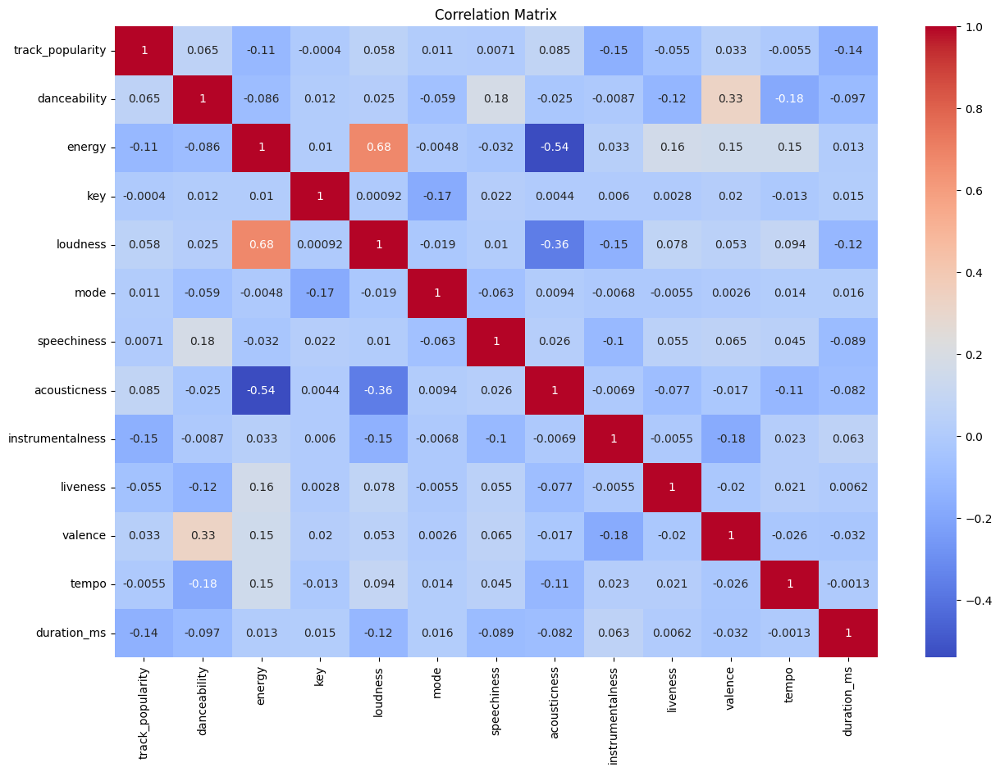

In [4]:
numeric_df = df[numerical_features]
# Correlation matrix
corr_matrix = numeric_df.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

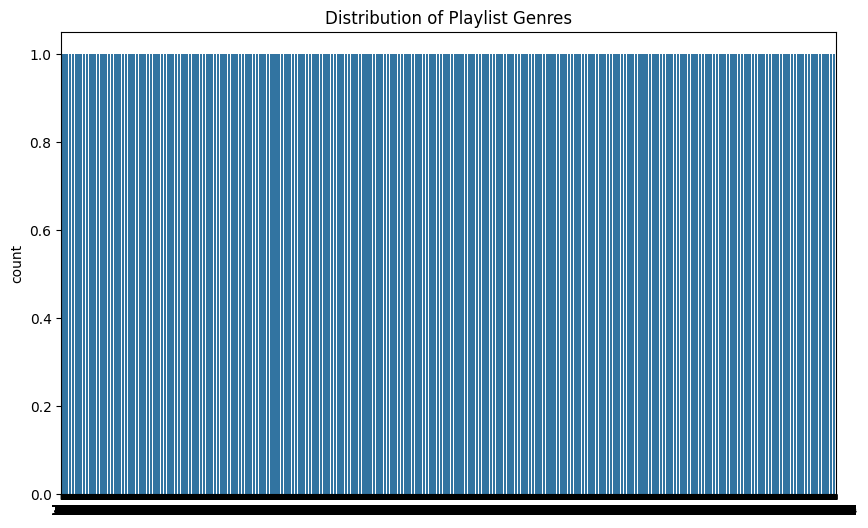

In [5]:
# Distribution of genres
plt.figure(figsize=(10, 6))
sns.countplot(df['playlist_genre'])
plt.title('Distribution of Playlist Genres')
plt.show()

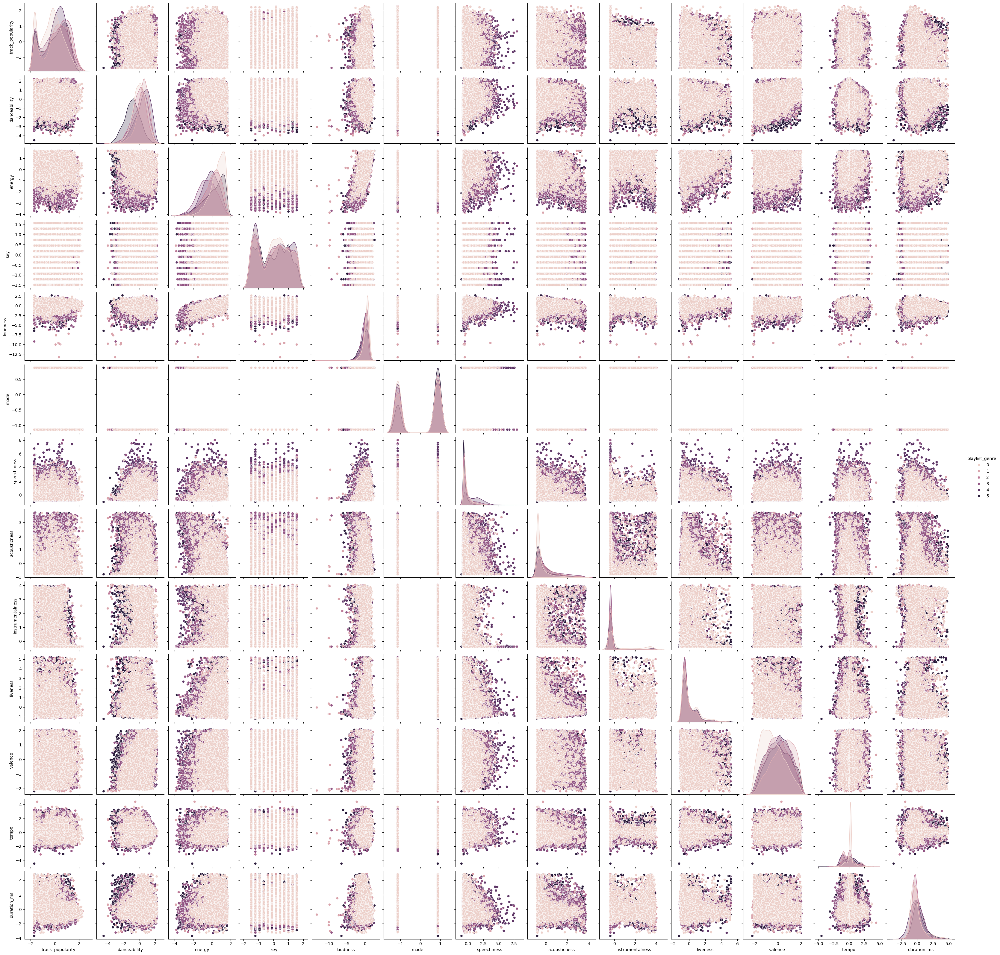

In [6]:
# Pairplot for visualizing relationships
sns.pairplot(df, vars=numerical_features, hue='playlist_genre')
plt.show()

In [7]:
# Step 4: Clustering
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df[numerical_features])
df['pca_one'] = pca_result[:,0]
df['pca_two'] = pca_result[:,1]

In [9]:
from sklearn.cluster import KMeans


kmeans = KMeans(n_clusters=5, n_init=10)
df['cluster'] = kmeans.fit_predict(df[numerical_features])


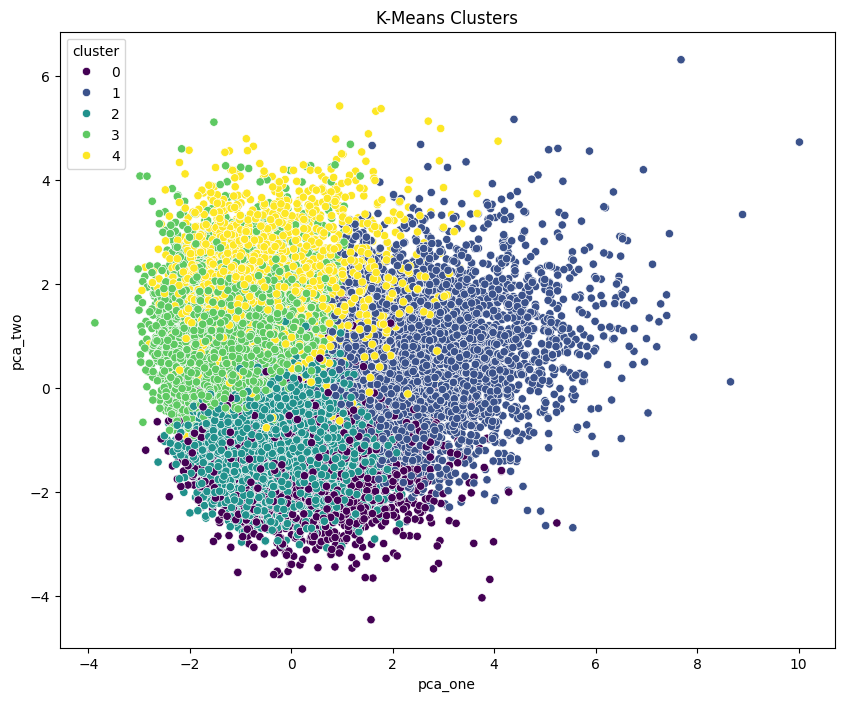

In [10]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='pca_one', y='pca_two', hue='cluster', palette='viridis', data=df)
plt.title('K-Means Clusters')
plt.show()

In [11]:
# Step 5: Model Building
knn = NearestNeighbors(n_neighbors=10)
knn.fit(df[numerical_features])

def recommend_songs(song_id, n_recommendations=5):
    distances, indices = knn.kneighbors(df.loc[df['track_id'] == song_id, numerical_features])
    recommendations = df.iloc[indices[0], :]
    return recommendations

In [12]:
song_id = '6f807x0ima9a1j3VPbc7VN'  # Replace with actual track ID
recommendations = recommend_songs(song_id)
print(recommendations)

                     track_id  \
29684  6f807x0ima9a1j3VPbc7VN   
0      6f807x0ima9a1j3VPbc7VN   
2371   5HOpkTTVcmZHnthgyxrIL8   
1040   0ahbzg4GCq3wJzUM3cjS3N   
1385   0GRoERSBBky3YgdKW2w2Vc   
231    0GRoERSBBky3YgdKW2w2Vc   
26871  3m0BCyPaS5BN5iQgtdPr0u   
28680  3m0BCyPaS5BN5iQgtdPr0u   
19886  3EFzexdYFIzbM2dusddMVk   
4678   3kGfazcbVvVkuZunzlLgTD   

                                              track_name   track_artist  \
29684  I Don't Care (with Justin Bieber) - Loud Luxur...     Ed Sheeran   
0      I Don't Care (with Justin Bieber) - Loud Luxur...     Ed Sheeran   
2371                    The Fox (What Does the Fox Say?)          Ylvis   
1040                                             Violeta         IZ*ONE   
1385                                               Brave     Don Diablo   
231                                                Brave     Don Diablo   
26871                Perfect (feat. Haris) - LUM!X Remix  Lucas & Steve   
28680                Perfect (feat. 